In [6]:
%load_ext autoreload
%autoreload 2

from pathlib import Path
import numpy as np
from sklearn.preprocessing import StandardScaler
import time

from matplotlib import pyplot as plt

import torch, torch.nn as nn

import re
import joblib
import itertools
from tqdm import trange, tqdm

from scipy.stats import gaussian_kde

import sys
sys.path.append('..')

from mh_2d import *
from models import (Generator_2d, Discriminator_2d)
from utils import Evolution, collect_evolution
from run_train import prepare_25gaussian_data

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
models_path = Path('../../gans_logs/25_gaussians_1/models')

In [8]:
X_train = np.load(Path(models_path.parent, 'x_train.npz'))['x_train']
means = np.array(list(itertools.product(np.arange(-2,3), repeat=2)))
sigma = .05

scaler = joblib.load(Path(models_path.parent, 'std_scaler.bin'))

n_test_pts = 10000
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
n_dim = 2

G = Generator_2d(n_dim = n_dim, n_hidden = 100).to(device)
D = Discriminator_2d(n_hidden = 100, top_nonlin=nn.Sigmoid()).to(device)

In [10]:
#samples = create_samples(models_path, X_train, D, G, device, batch_size=16, n_calib_pts=16*100)

In [12]:
mh_gan_samples = np.load('mh_samples.npz')['samples']
print(mh_gan_samples.shape)

(36, 10000, 2)


In [11]:
discriminator_regexp = "*_discriminator.pth"
generator_regexp = "*_generator.pth"
discriminator_name = list(sorted([f for f in models_path.glob(discriminator_regexp)], key=lambda x: int(re.findall(r'\d+', x.name)[-1])))
generator_name = list(sorted([f for f in models_path.glob(generator_regexp)], key=lambda x: int(re.findall(r'\d+', x.name)[-1])))

In [13]:
gan_samples = []

for g_name in generator_name:
    G.load_state_dict(torch.load(g_name))
    gan_samples.append(G.sampling(batch_size=n_test_pts).detach())

In [16]:
gan_evolution = collect_evolution(gan_samples, means, sigma, scaler, D, G, models_path,  device)
mh_gan_evolution = collect_evolution(mh_gan_samples, means, sigma, scaler, D, G, models_path, device)

36it [00:30,  1.19it/s]
36it [00:15,  2.32it/s]


In [17]:
np.savez_compressed(Path(Path(models_path).parent, 'gan_evol'), **gan_evolution.as_dict())
np.savez_compressed(Path(Path(models_path).parent, 'mh_gan_evol'), **mh_gan_evolution.as_dict())

In [18]:
evol = gan_evolution.as_dict()
mh_evol = mh_gan_evolution.as_dict()

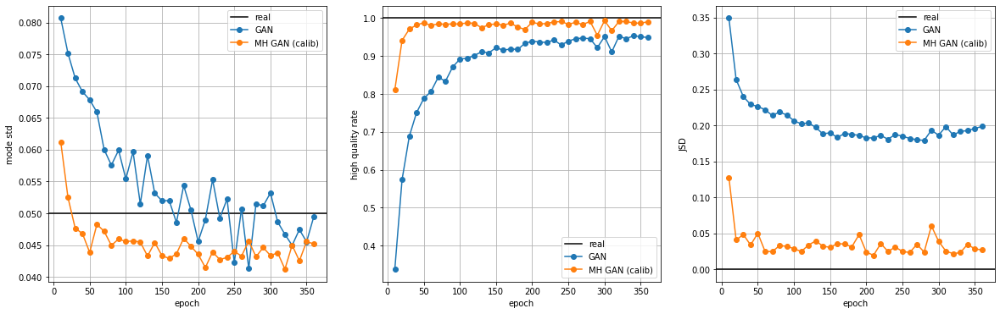

In [19]:
fig, axs = plt.subplots(ncols=3, nrows=1, figsize=(20, 6))


axs[0].axhline(sigma, label='real', color='black')
axs[0].set_xlabel('epoch')
axs[0].set_ylabel('mode std')

axs[1].axhline(1, label='real', color='black')
axs[1].set_xlabel('epoch')
axs[1].set_ylabel('high quality rate')

axs[2].axhline(0, label='real', color='black')
axs[2].set_xlabel('epoch')
axs[2].set_ylabel('JSD')

axs[0].plot(np.arange(1, len(evol['mode_std'])+1) * 10, evol['mode_std'], label='GAN', marker='o')
axs[1].plot(np.arange(1, len(evol['mode_std'])+1) * 10, evol['hqr'], label='GAN', marker='o')
axs[2].plot(np.arange(1, len(evol['mode_std'])+1) * 10, evol['jsd'], label='GAN', marker='o')


axs[0].plot(np.arange(1, len(evol['mode_std'])+1) * 10, mh_evol['mode_std'], label='MH GAN (calib)', marker='o')
axs[1].plot(np.arange(1, len(evol['mode_std'])+1) * 10, mh_evol['hqr'], label='MH GAN (calib)', marker='o')
axs[2].plot(np.arange(1, len(evol['mode_std'])+1) * 10, mh_evol['jsd'], label='MH GAN (calib)', marker='o')

for ax in axs:
    ax.grid()
    ax.legend()
    
plt.savefig(Path(Path(models_path).parent, 'evolution_plot.png'))
plt.show()

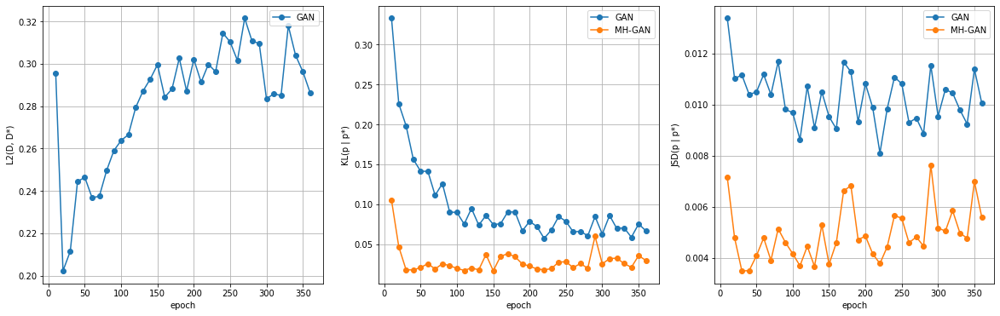

In [20]:
fig, axs = plt.subplots(ncols=3, nrows=1, figsize=(20, 6))


#axs[0].axhline(sigma, label='real', color='black')
axs[0].set_xlabel('epoch')
axs[0].set_ylabel('L2(D, D*)')

#axs[1].axhline(1, label='real', color='black')
axs[1].set_xlabel('epoch')
axs[1].set_ylabel('KL(p | p*)')

#axs[2].axhline(0, label='real', color='black')
axs[2].set_xlabel('epoch')
axs[2].set_ylabel('JSD(p | p*)')

axs[0].plot(np.arange(1, len(evol['kl_pis'])+1) * 10, evol['l2_div'], label='GAN', marker='o')
axs[1].plot(np.arange(1, len(evol['kl_pis'])+1) * 10,evol['kl_pis'], label='GAN', marker='o')
axs[2].plot(np.arange(1, len(evol['kl_pis'])+1) * 10, evol['js_pis'], label='GAN', marker='o')

axs[1].plot(np.arange(1, len(evol['kl_pis'])+1) * 10, mh_evol['kl_pis'], label='MH-GAN', marker='o')
axs[2].plot(np.arange(1, len(evol['kl_pis'])+1) * 10, mh_evol['js_pis'], label='MH-GAN', marker='o')

for ax in axs:
    ax.grid()
    ax.legend()
    
plt.savefig(Path(Path(models_path).parent, f'divs.png'))
plt.show()

In [386]:
import datetime

def visualize_fake_data_projection(fake_data, X_train, path_to_save, proj_1, proj_2, 
                                   title,
                                   mode):
    fake_data_proj = fake_data[:, [proj_1, proj_2]]
    X_train_proj = X_train[:, [proj_1, proj_2]]

    plt.figure(figsize=(8, 8))
    # plt.xlim(-2., 2.)
    # plt.ylim(-2., 2.)
    plt.title(title, fontsize=20)
    X_train_proj = X_train[:, [proj_1, proj_2]]


    plt.scatter(X_train_proj[:, 0], X_train_proj[:, 1], alpha=0.5, color='gray',
                marker='o', label = 'training samples')
    plt.scatter(fake_data_proj[:, 0], fake_data_proj[:, 1], alpha=0.5, color='blue',
                marker='o', label = 'samples by G')
    plt.xlabel(f"proj ind = {proj_1 + 1}")
    plt.ylabel(f"proj ind = {proj_2 + 1}")
    plt.legend()
    plt.grid(True)
    if path_to_save is not None:
       #cur_time = datetime.datetime.now().strftime('%Y_%m_%d-%H_%M_%S')
       plot_name =  mode + f"_proj1_{proj_1}_proj2_{proj_2}.png"
       path_to_plot = os.path.join(path_to_save, plot_name)
       plt.savefig(path_to_plot)

    else:
       plt.show()

In [260]:
X_ = G.sampling(batch_size=10000).detach().cpu().numpy()

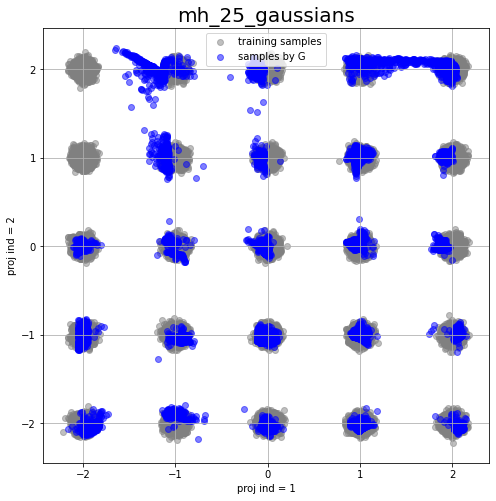

In [56]:
visualize_fake_data_projection(scaler.inverse_transform(X), scaler.inverse_transform(X_train), '.', 0, 1, 'mh_25_gaussians', '')